## Image Augmentation and Chunking

The purpose of this notebook is to experiment with approaches to augmenting, cropping, and/or chunking our images.  The fundamental goal is to artificially increase the size and diversity of our training set.  We set up a pipeline that does the following:
- Takes an input image and generates N images by applying various augmentations
- Chunks those sub-images
- Has parameters for augmentation options (e.g. flip, rotate..) and chunking options (e.g. number of chunks, shape of chunks..)
- Includes function(s) to detect patches of pure whitespace, calculate their fraction of a given image, and flag the image as being above a given whitespace threshold).
- Includes functions to detect/highlight blur introduced by flipping images, and set that blur to a color not otherwise found in our images (so we can easily detect and exlude blurred regions in sub-images).

In [1]:
# Imports

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
from PIL import Image
import os
import pandas as pd
import numpy as np
from statistics import mode
from keras.preprocessing.image import load_img

%matplotlib inline

/Users/mzomnir/anaconda/envs/mgh_lung/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using Theano backend.


### I. EDA
Let's run some quick checks on the images.

In [2]:
# note that preprocessed images also contains all the originals
directory_in_str = '/Volumes/LaCie/MGH_lung_photos/original_images/'
directory = os.fsencode(directory_in_str)

image_sizes = []
min_size = (9999,9999)
max_size = (-1,-1)
squares = 0
non_squares = 0
smallest_img = None
biggest_img = None

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    img = Image.open(filename_full)
    w,h = img.size
    # Add image size tuple to the list
    image_sizes.append((w,h))
    # Check for new min or max image size
    if w*h < min_size[0]*min_size[1]:
        min_size = (w,h)
        smallest_img = img
    elif w*h > max_size[0]*max_size[1]:
        max_size = (w,h)
        biggest_img = img
    # Check if the image is a square and augment accordingly
    if w == h:
        squares += 1
    else:
        non_squares += 1
    
    

total images: 8334
min_size: (196, 250)
max_size: (1920, 1200)
mode_size: (1920, 1200)
mode_size_count: 3133 images
squares: 2
non_squares: 8332


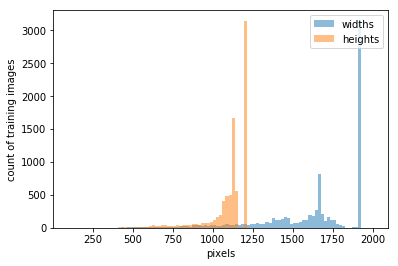

In [3]:
print("total images: " + str(len(image_sizes)))
print("min_size: " + str(min_size))
print("max_size: " + str(max_size))
mode_size = mode(image_sizes)
mode_size_count = image_sizes.count(mode_size)
print("mode_size: " + str(mode_size))
print("mode_size_count: " + str(mode_size_count) + " images")
print("squares: " + str(squares))
print("non_squares: " + str(non_squares))

widths = [i[0] for i in image_sizes]
heights = [i[1] for i in image_sizes]
bins = np.linspace(100, 2000, 100)
plt.hist(widths, bins, alpha=0.5, label='widths')
plt.hist(heights, bins, alpha=0.5, label='heights')
plt.legend(loc='upper right')
plt.xlabel("pixels")
plt.ylabel("count of training images")
plt.show()

smallest_img.show()
biggest_img.show()

We see there is a fair amount of variation in the sizes of our images.  The plurality are (1920, 1200).  

### II. Augmentation
Experiment with and implement some of the augmentation options from Keras

In [2]:
from PIL import ImageOps

In [3]:
# NOTE: need to change PNG images to JPegs before running through

# sample_image_path = '/Users/mzomnir/lung_cancer_mutation_detection/data/original_images/CID15-5761_1.PNG'
sample_image_path = '/Volumes/LaCie/MGH_lung_photos/original_images/cid15-2158_17.jpg'
im = Image.open(sample_image_path)

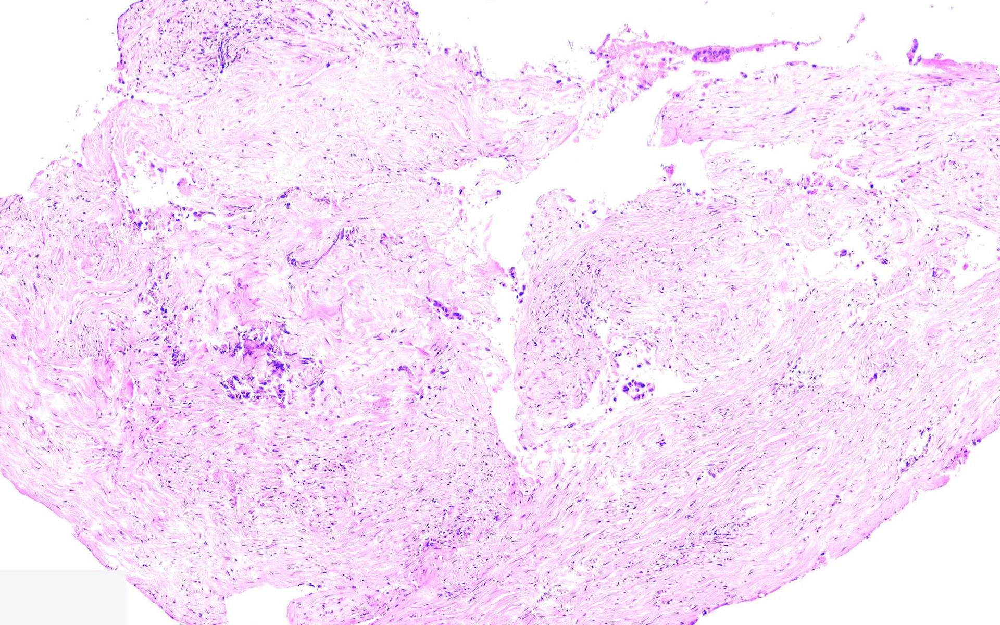

In [4]:
im

## Convert all PNGs to jpg
Do this in preparation for training in Keras.

In [13]:
# Check the number of PNGs and jpgs before conversion
import glob

pngCounter = len(glob.glob1(directory_in_str,"*.PNG"))
print(pngCounter)

jpgCounter = len(glob.glob1(directory_in_str,"*.jpg"))
print(jpgCounter)

print(str(pngCounter + jpgCounter))

0
8334
8334


In [44]:
# Iterate over all image files in the directory, and convert PNGs to JPGs
counter = 0
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    img = Image.open(filename_full)
    # If the file is a PNG...
    if filename[filename.index('.'):] == '.PNG':
        # Convert it to a jpg
        rgb_img = img.convert('RGB')
        # Change its name accordingly
        filename_jpg = filename[:filename.index('.')] + '.jpg'
        # Create a full filepath with the new name
        filename_jpg_full = os.path.join(directory_in_str, filename_jpg)
        # Save the converted image with that new filepath
        rgb_img.save(os.path.join(directory_in_str, filename_jpg_full))
        # Remove the old (PNG) image
        os.remove(filename_full)
        counter += 1
        if counter % 100 == 0:
            print(str(counter) + " PNG files converted to jpg")

In [45]:
# Check the number of PNGs and jpgs after conversion
import glob

pngCounter = len(glob.glob1(directory_in_str,"*.PNG"))
print(pngCounter)

jpgCounter = len(glob.glob1(directory_in_str,"*.jpg"))
print(jpgCounter)

print(str(pngCounter + jpgCounter))

0
8334
8334


In [14]:
# Confirm that all the files after conversion have unique names

l = []

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    l.append(filename)
    
print(len(set(l)))

8334


How did we lose 8368 - 8334 = 34 images?  I guess the conversions somehow failed (without throwing an error), and we deleted the original (PNG) files in those cases?  You should check your filenames against Will's to see what you lost.

## Moving on to augmentation

From the above, we know how to rotate as well as flip an image.  We also know how to normalize an image, but we can implement that later (at run-time).  Otherwise, it makes the images appear all black, since pixel values range from -1 to 1.

Let's write wrapper functions for rotating and flipping:

In [8]:
def generate_rotated_images(base_image_path, outdir, rotation_angle=90, save_results=True):
    
    # Catch invalid rotation angle in args
    if 360 % rotation_angle != 0 or rotation_angle > 360 or rotation_angle <= 0:
        print("invalid rotation angle")
        return
    
    # Generate the rotated images
    base_image = Image.open(base_image_path)
    base_image_name = os.path.basename(base_image_path).split('.')[0]
    num_rotations = int(360 / rotation_angle)
    # initialize the list of images to be returned
    rotated_images = []
    # Rotate the images; start at 0 to include the original (unrotated) image
    for i in range(0, num_rotations):
        rotated_image = base_image.rotate(rotation_angle * i, expand=True)
        rotated_images.append(rotated_image)
        
        # Save the rotated image to whereever you want to save it
        # You should put the base image name at the beginning
        if save_results:
            rotated_image.save(os.path.join(outdir, base_image_name + '_rotated_' + str(i*rotation_angle) + '.jpg'))
        
    return rotated_images


In [21]:
# Normalize images
def generate_normalized_images(base_image_path, outdir):
    
    # Generate the rotated images
    base_image = Image.open(base_image_path)
    base_image_name = os.path.basename(base_image_path).split('.')[0]

    arr = np.array(base_image)
    
    arr = arr / 255 * 2 - 1

    print(type(arr))
    print(arr.shape)
    print(np.max(arr))
    print(np.min(arr))
    
    normalized_image = PIL.Image.fromarray(arr)
    
    normalized_image.save(os.path.join(outdir, base_image_name))
        
    return

In [1]:
directory_in_str = '/Volumes/LaCie/MGH_lung_photos/chunk_test/'
directory = os.fsencode(directory_in_str)

outdir = '/Volumes/LaCie/MGH_lung_photos/chunk_test_normalized/'

counter = 0
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    generate_normalized_images(filename_full, outdir)
    counter += 1

In [9]:
def generate_flipped_images(base_image_path, outdir, flip_axis='both', save_results=True):
    #flipped can be 'horizontal', 'vertical', or 'both'
    
    # Generate the flipped images
    base_image = Image.open(base_image_path)
    base_image_name = os.path.basename(base_image_path).split('.')[0]
    # Initialize the list of images to be returned. Include the base image.
    flipped_images = [base_image]
    
    # Rotate the images; start at 0 to include the original (unrotated) image
    if flip_axis == 'horizontal':
        flipped_image = base_image.transpose(Image.FLIP_LEFT_RIGHT)
        flipped_images.append(flipped_image)
        if save_results:
            base_image.save(os.path.join(outdir, base_image_name + '_flipped_none' + '.jpg'))
            flipped_image.save(os.path.join(outdir, base_image_name + '_flipped_horizontally' + '.jpg'))
            
    elif flip_axis == 'vertical':
        flipped_image = base_image.transpose(Image.FLIP_TOP_BOTTOM)
        flipped_images.append(flipped_image)
        if save_results:
            base_image.save(os.path.join(outdir, base_image_name + '_flipped_none' + '.jpg'))
            flipped_image.save(os.path.join(outdir, base_image_name + '_flipped_vertically' + '.jpg'))
        
    else:
        
        flipped_image_horizontal = base_image.transpose(Image.FLIP_LEFT_RIGHT)
        flipped_images.append(flipped_image_horizontal)
        
        flipped_image_vertical = base_image.transpose(Image.FLIP_TOP_BOTTOM)
        flipped_images.append(flipped_image_vertical)
        
        if save_results:
            base_image.save(os.path.join(outdir, base_image_name + '_flipped_none' + '.jpg'))
            flipped_image_horizontal.save(os.path.join(outdir, base_image_name + '_flipped_horizontally' + '.jpg'))
            flipped_image_vertical.save(os.path.join(outdir, base_image_name + '_flipped_vertically' + '.jpg'))

    return flipped_images

We need to write a function to chunk up our images.  Modify the one below (from StackOverflow).

In [105]:
# function to chunk up an image

def chunk_image(image_path, outdir, sliceHeight=299, sliceWidth=299, save_results=True):
    
    chunks = []
    image_name = os.path.basename(image_path).split('.')[0]
    img = Image.open(image_path) # Load image
    imageWidth, imageHeight = img.size # Get image dimensions
    left = 0 # Set the left-most edge
    upper = 0 # Set the top-most edge
    slice_counter = 0
    while (left < imageWidth):
        while (upper < imageHeight):
            if(upper + sliceHeight <= imageHeight and left + sliceWidth < imageWidth):
                bbox = (left, upper, left + sliceWidth, upper + sliceHeight)
                working_slice = img.crop(bbox) # Crop image based on created bounds
                chunks.append(working_slice)
                if save_results:
                    working_slice.save(os.path.join(outdir, image_name + '_slice_' + str(slice_counter) + '.jpg'))
            slice_counter += 1
            
            upper += sliceHeight # Increment the horizontal position
        left += sliceWidth # Increment the vertical position
        upper = 0
    return chunks

The chunk_image function works, but it has some drawbacks: it arbitrarily starts from the upper left of the image, and only takes as many 299x299 chunks as it can, so we lose some info on the right and bottome edges of the frame. For these images, there's no gaurantee of where the whitespace will be- images aren't necessarily centered in the frame.  We'll explore this in the next section of the notebook; it would be better to do the chunking more intelligently, so as to end up throwing away as few image chunks (and as little information) as possible...

### Summary of preprocessing and augmentation approach:

First, we convert all our images to jpg form.

Next:
We'll do the new image creation in passes:
- 1st pass: for each image, generate rotations and add them to the rotated_images directory
- 2nd pass: for each image, generate flips and add them to the rotated_and_flipped directory
- 3rd pass: for each image, generate chunks, and add the chunks to a final directory
- at every pass, name include the rotation, flipping, and chunking in the file name in a standardized way

Really need to think through the best way to do this (given access to a 2TB external hard drive).  Best procedure is probably to:
- Copy all the original photos to the hard drive
- Do the passes described above, on the hard drive
- Move the final/preprocessed images into Google Cloud (cost?)

Don't forget that you still have to convert all PNG images to JPG, and preserve the info about the original file in the new files...

## Handling Whitespace
Let's do some EDA and come up with a way to elminate images that contain mostly whitespace.

In [10]:
## experimenting with whitespace calculations
a = np.array(flip_results[2])
np.median(a)

247.0

In [47]:
median_image_pixel_values = []
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    img = Image.open(filename_full)
    arr = np.array(img)
    median_image_pixel_values.append(np.median(arr))


In [54]:
median_image_pixel_values.count(255)

624

Distribution of median pixel values of images


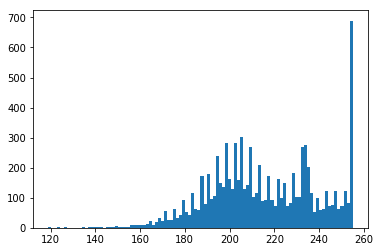

In [56]:
print("Distribution of median pixel values of images")
plt.hist(median_image_pixel_values, bins = 100)
plt.show()

If we threw out ever image whose median pixel value what pure white (255), we'd throw away nearly 700 images.

In [58]:
# Find an example of an image whose median pixel value is 255 (i.e. and image that's mostly white)
median_image_pixel_values = []
ex = None
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    img = Image.open(filename_full)
    arr = np.array(img)
    # median_image_pixel_values.append(np.median(arr))
    if np.median(arr) == 255:
        ex = img
        break

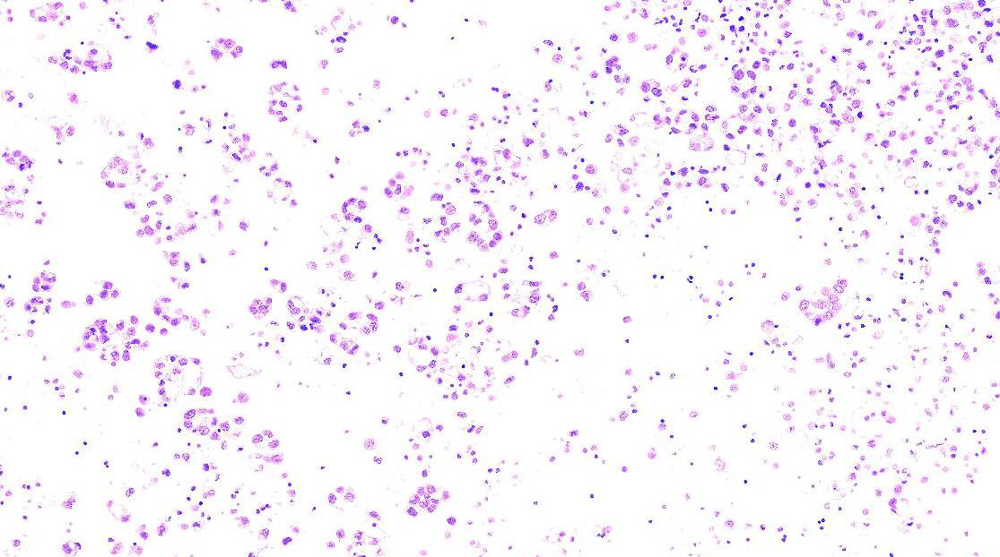

In [59]:
ex

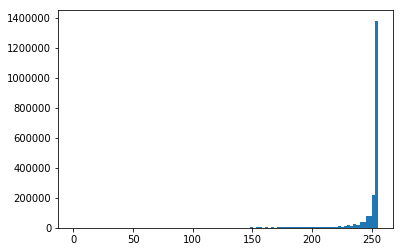

In [63]:
# Let's see what the distribution of pixel values looks like for this mostly-white image
plt.hist(np.array(ex).flatten(), bins = 100)
plt.show()

Median pixel value: 248.0


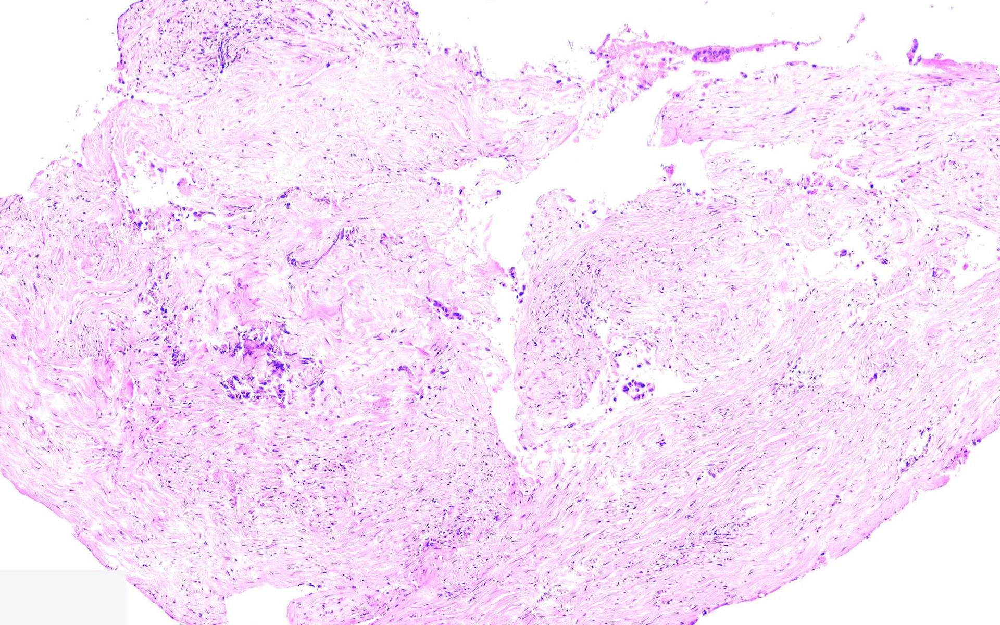

In [143]:
# Now let's compare to a more normal image:
print("Median pixel value: " + str(np.median(np.array(im))))
im

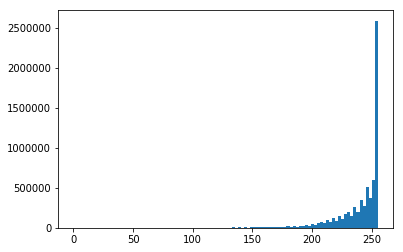

In [65]:
# Check the pixel value distribution for the more normal image
plt.hist(np.array(im).flatten(), bins = 100)
plt.show()

Its distribution doesn't look much different from the mostly-white image. Let's check the median

We'll need to define a white-space threshold, but it's going to be tricky, because white pixels seem to be the majority in most of our images.

Joe had mentioned that cytology (c) and biopsy (b) tend to have a lot more whitespace than tissue (t) samples.  Let's check this.  We'll need to read in the Training ML file to match images to sample types.

In [70]:
label_data = pd.read_csv('/Users/mzomnir/lung_cancer_mutation_detection/Training_ML_clean.csv')

In [71]:
label_data.columns

Index(['No', 'Count', 'Training cases final', 'FOV', 'Sample', 'Ther',
       'Fusion', 'Driver', 'Dr_YN', 'Pathway', 'CC', 'O/T', 'AKT1', 'ALK',
       'APC', 'BRAF', 'CDH1', 'CDKN2A', 'CTNNB1', 'DDR2', 'EGFR', 'ERBB2',
       'ESR1', 'FBXW7', 'FGFR1', 'FGFR2', 'FGFR3', 'FOXL2', 'GNA11', 'GNAQ',
       'GNAS', 'HRAS', 'IDH1', 'IDH2', 'KIT', 'KRAS', 'MAP2K1', 'MET',
       'NOTCH1', 'NRAS', 'PDGFRA', 'PIK3CA', 'PIK3R1', 'PTEN', 'RET', 'ROS1',
       'SMAD4', 'SMO', 'STK11', 'TP53', 'VHL'],
      dtype='object')

In [72]:
label_data.head(5)

,No,Count,Training cases final,FOV,Sample,Ther,Fusion,Driver,Dr_YN,Pathway,...,PIK3CA,PIK3R1,PTEN,RET,ROS1,SMAD4,SMO,STK11,TP53,VHL
0,403,1,CID15-5959,15,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,535,2,CID15-7918,18,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,539,3,CID15-7981,34,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,627,4,CID16-1077,1,b,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,91,5,CID14-6341,20,t,1,1.0,RET,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Let's do a quick check of our case counts by sample type:

In [74]:
label_data['Sample'].value_counts()

t    396
b    233
c    111
Name: Sample, dtype: int64

In [91]:
label_data['Training cases final UPPER'] = label_data['Training cases final'].apply(lambda x : x.upper())

In [93]:
label_data.head(5)

,No,Count,Training cases final,FOV,Sample,Ther,Fusion,Driver,Dr_YN,Pathway,...,PIK3R1,PTEN,RET,ROS1,SMAD4,SMO,STK11,TP53,VHL,Training cases final UPPER
0,403,1,CID15-5959,15,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CID15-5959
1,535,2,CID15-7918,18,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,CID15-7918
2,539,3,CID15-7981,34,t,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CID15-7981
3,627,4,CID16-1077,1,b,1,1.0,ROS1,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CID16-1077
4,91,5,CID14-6341,20,t,1,1.0,RET,1,RTK/GF_actionable,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,CID14-6341


We'll create dicts for each of the Sample types that map images names to their arrays of pixels.  Then we'll loop over those dicts to get the median pixel values across the three sample types (t, b, c).

In [2]:
t_imarrays_dict = {}
b_imarrays_dict = {}
c_imarrays_dict = {}

median_image_pixel_values = []
counter = 0

for file in os.listdir(directory):
    filename = os.fsdecode(file)
    case = filename.split('_')[0]
    
    try:
        sample_type = label_data.loc[label_data['Training cases final UPPER'] == case.upper(), 'Sample'].iloc[0]
    except IndexError:
        print("Funny imagename format for image: " + filename)
        continue
    filename_full = os.path.join(directory_in_str, filename)
    img = Image.open(filename_full)
    
    if sample_type == 't':
        t_imarrays_dict[filename] = np.array(img)
    elif sample_type == 'b':
        b_imarrays_dict[filename] = np.array(img) 
    elif sample_type == 'c':
        c_imarrays_dict[filename] = np.array(img)
    else:
    counter += 1

Start with Sample = tissue. We'd expect these images to have the least white on average.

In [99]:
t_median_pixel_values = [np.median(pic_arr.flatten()) for pic_arr in t_imarrays_dict.values()]

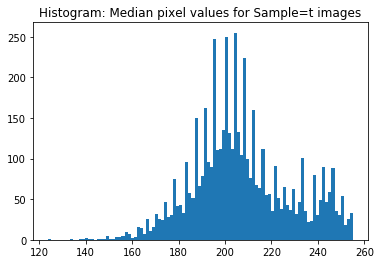

In [141]:
plt.hist(t_median_pixel_values, bins=100)
plt.title("Histogram: Median pixel values for Sample=t images")
plt.show()

Let's see a few of the tisse images with median pixel values of 255 (white)

In [1]:
sample_t_255s = []
for k, v in t_imarrays_dict.items():
    if np.median(v) == 255:
        sample_t_255s.append(k)
    if len(sample_t_255s) == 5:
        break

In [2]:
# Flip through indices 0-4 and look at the pics
filename_full = os.path.join(directory_in_str, sample_t_255s[4])
img = Image.open(filename_full)
img

There defnintely seems to be some valuabe/usuable regions within these tissue slides, even thouthg there's a lot of whitespace.  We wouldn't want to throw out the entire image.

Supposing we chunked the above image into 299x299 blocks (and remembering that the main image has a median pixel value of 255), how many of those blocks would have median pixel values of 255?  Let's try it:

In [13]:
test_chunks = chunk_image(filename_full, 'do not save', 299, 299)

In [14]:
# Check the median pixe values for each chunk (i.e. each 299x299 sub-image)
print(len(test_chunks))
chunk_index = 0
for chunk in test_chunks:
    print("chunk " + str(chunk_index) + ", Median pixel value = " + str(np.median(np.array(chunk))))
    chunk_index += 1

12
chunk 0, Median pixel value = 161.0
chunk 1, Median pixel value = 164.0
chunk 2, Median pixel value = 203.0
chunk 3, Median pixel value = 218.0
chunk 4, Median pixel value = 210.0
chunk 5, Median pixel value = 191.0
chunk 6, Median pixel value = 208.0
chunk 7, Median pixel value = 205.0
chunk 8, Median pixel value = 169.0
chunk 9, Median pixel value = 188.0
chunk 10, Median pixel value = 198.0
chunk 11, Median pixel value = 178.0


Looks like the majority of chunks have median pixel values of 255.  Let's see what the chunks look like in reality:

IndexError: list index out of range

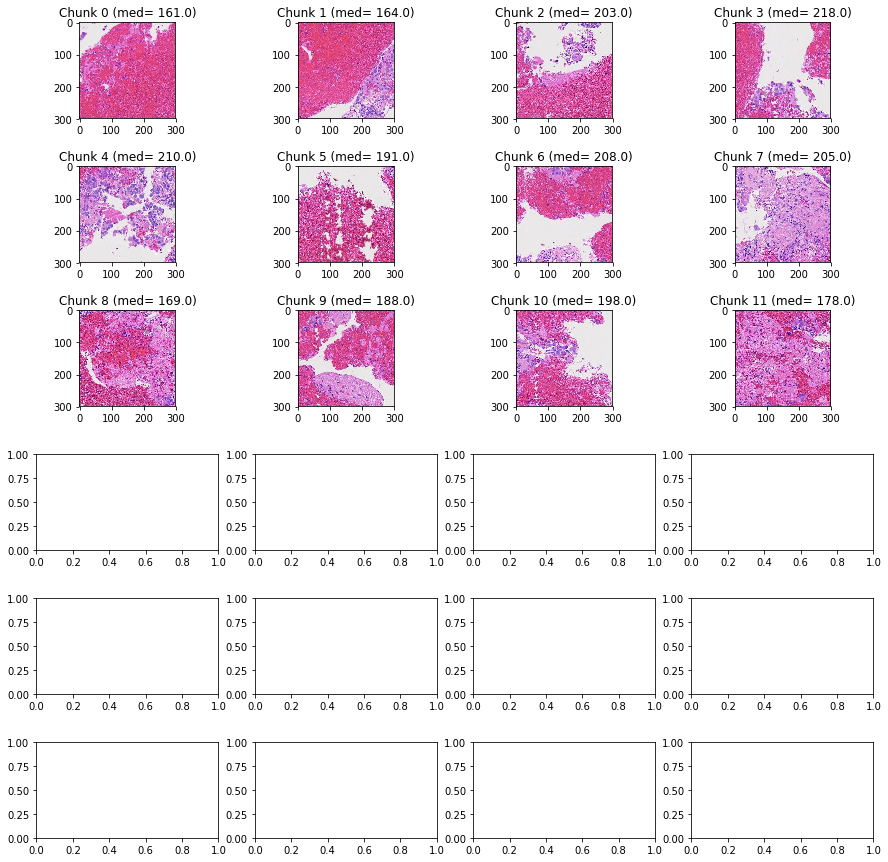

In [15]:
rows = 6
cols = 4
f, axarr = plt.subplots(rows, cols, figsize=(15,15))
f.subplots_adjust(hspace=.5)
for i in range(rows):
    for j in range(cols):
        test_chunks_index = cols * i + j
        axarr[i,j].set_title("Chunk " + str(test_chunks_index) + 
                             " (med= " + str(np.median(np.array(test_chunks[test_chunks_index]))) + ")")
        axarr[i,j].imshow(test_chunks[test_chunks_index])

Plotting chunks and pixel values above gives us some idea of what we'd throw out if we throw out images having median pixel values of 255.  In some cases, that seems reasonable, but in others (e.g. chunks 8, 10) we seem to be throwing away a good bit of usable imagery.

Moving along, let's look at the distribution of median pixel values for Sample=b images:

In [102]:
# Next, do the same for sample = biopsy
b_median_pixel_values = [np.median(pic_arr.flatten()) for pic_arr in b_imarrays_dict.values()]

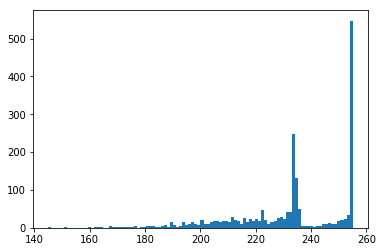

In [103]:
plt.hist(b_median_pixel_values, bins=100)
plt.show()

As expected, the distribution of meian pixel values for biopsy (b) samples is shifted way to the right relative to the one for tissue samples.  The plurality of its tissue sample images have median pixel values of 255.

Finally, check sample = cytology (c), which we expect to be the worst of the three for white space by far:

In [105]:
c_median_pixel_values = [np.median(pic_arr.flatten()) for pic_arr in c_imarrays_dict.values()]

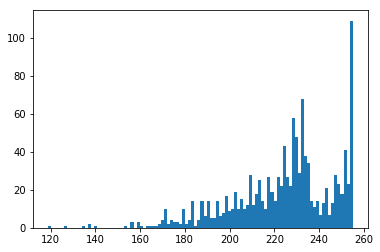

In [106]:
plt.hist(c_median_pixel_values, bins=100)
plt.show()

Interestingly, cytology seems to be no worse (and maybe even a bit better) than tissue in terms of white space.  Compared to tissue samples, cytology's distribution is significantly rightward, and the plurality of its images still have median pixel values of 255.

Test out of experimental ways of handling whitespace

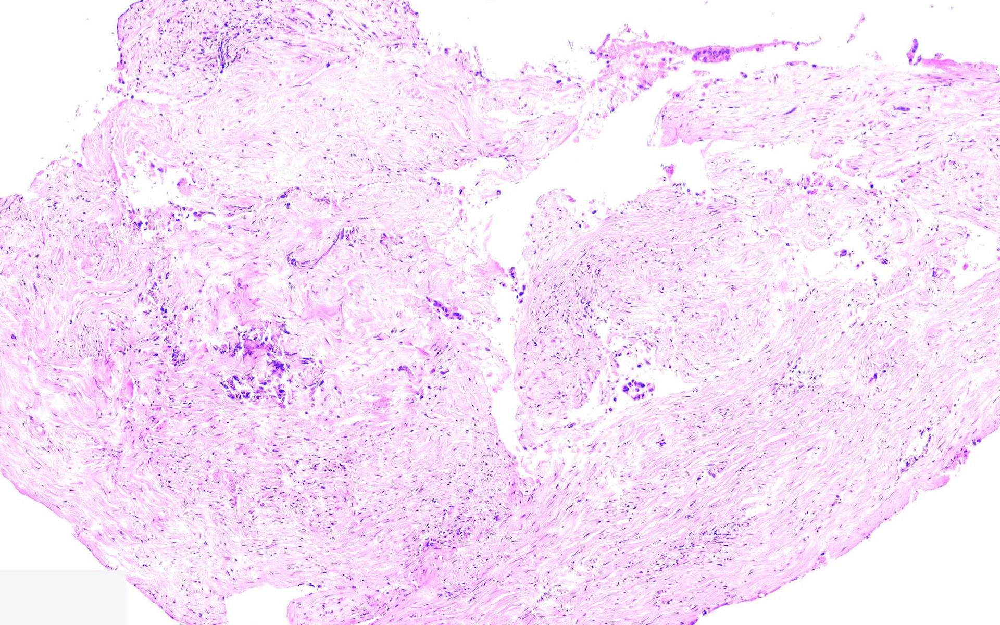

In [9]:
from PIL import Image, ImageChops

def trim(im):
    bg = Image.new(im.mode, im.size, im.getpixel((0,0)))
    diff = ImageChops.difference(im, bg)
    diff = ImageChops.add(diff, diff, 2.0, -100)
    bbox = diff.getbbox()
    if bbox:
        return im.crop(bbox)


im_trimmed = trim(im)
im_trimmed

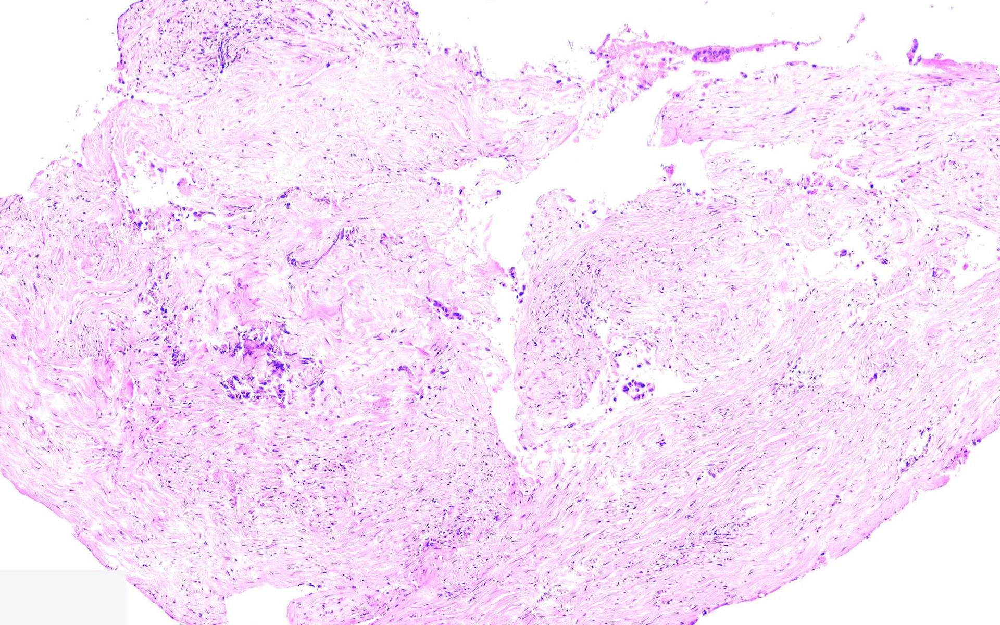

In [10]:
im

That didn't seem to do anything at all.  Different idea: can we "smartly" slide our 299x299 window across the image, stopping and starting based on gradients?  

## Initial chunked training set

For now, we're going to go ahead with our naive chunking approach and simply filter out chunks with median pixel values of less than 255.  Let's see where that puts us.

#### Step 1: Generate rotations
We'll take our original images, generate rotations of each of them (90 degrees at a time), and store the results to the rotated_images directory (on my hard drive)

In [13]:
# Commented out the code below because we don't want to accidentally re-run it

directory_in_str = '/Volumes/LaCie/MGH_lung_photos/original_images/'
directory = os.fsencode(directory_in_str)

rotate_outdir = '/Volumes/LaCie/MGH_lung_photos/rotated_images/'

In [15]:
# Count the files in our rotated_and_flipped_images directory
path, dirs, files = next(os.walk(rotate_outdir))
file_count = len(files)
print(file_count)

33336


#### Step 2: Generate flips
We'll take our rotated images, generate flips of each of them, and store the results to the rotated_and_flipped_images directory (on my hard drive).

In [9]:
directory_in_str = '/Volumes/LaCie/MGH_lung_photos/rotated_images/'
directory = os.fsencode(directory_in_str)

flipped_outdir = '/Volumes/LaCie/MGH_lung_photos/rotated_and_flipped_images/'

In [12]:
# Count the files in our rotated_and_flipped_images directory
path, dirs, files = next(os.walk(flipped_outdir))
file_count = len(files)
print(file_count)

100008


## Step 3: Chunking (and flitering for whitespace)
Since we have the luxury of plenty of storage, we'll generate chunks of all of our images, regardless of whitespace.  Later, we can try different thresholds to determine which chunks we'll keep for training.  Further on, we should also come up with a more intelligent chunking algorithm).

In [2]:
# Let's speed things up with multiprocessing
import multiprocessing as mp

In [3]:
from collections import namedtuple

In [4]:
ChunkImageArgs = namedtuple('ChunkImageArgs', ['filename_full', 'outdir',
                                              'sliceHeight', 'sliceWidth', 'save_results'])

In [133]:
# Generate a list of ChunkImageArgs nametuples

directory_in_str = '/Volumes/LaCie/MGH_lung_photos/rotated_and_flipped_images/'
directory = os.fsencode(directory_in_str)

outdir = '/Volumes/LaCie/MGH_lung_photos/all_chunks/'

all_chunks_and_args = []

# Commenting out below to avoid accidentally rerunning

# for file in os.listdir(directory):
#     filename = os.fsdecode(file)
#     filename_full = os.path.join(directory_in_str, filename)
#     chunk_args = ChunkImageArgs(filename_full, outdir, 299, 299, True)
#     all_chunks_and_args.append(chunk_args)

# # Make sure we got them all
# print(len(all_chunks_and_args))

100008


In [134]:
# Quick check of an element
all_chunks_and_args[1]

ChunkImageArgs(filename_full='/Volumes/LaCie/MGH_lung_photos/rotated_and_flipped_images/CID14-4797_1_rotated_0_flipped_none.jpg', outdir='/Volumes/LaCie/MGH_lung_photos/all_chunks/', sliceHeight=299, sliceWidth=299, save_results=True)

In [135]:
# Time for chunking with multiprocessing
pool = mp.Pool(processes=8)

for chunk in all_chunks_and_args:
    pool.apply_async(chunk_image, chunk)

pool.close()
pool.join()

In [136]:
# There should still be 100,008 in the input directory
path, dirs, files = next(os.walk(directory_in_str))
file_count = len(files)
print(file_count)

100008


In [137]:
# Check how many chunks we have
path, dirs, files = next(os.walk(outdir))
file_count = len(files)
print(file_count)

1681470


Look like we have a little short of 1.7 million chunks.  Next, we'll want to set a threshold that will remove chunks with all/too much whitespace.

For the first iteration, we're just going to create a new directory that only contains images with median pixel values of under 255.  We'll want to use multiprocessing again, as calculating the median pixel value of each image, over so many images, is costly.  So first, we need to write out a function that checks an image's median pixel value, and copies it to a new directory if that value is under 25.

In [30]:
def check_median_pixel_value(image_path, copy_directory_path, save=True):
    
    image_name = os.path.basename(image_path).split('.')[0]
    img = Image.open(image_path) # Load image
    
    # Convert the image to a numpy array
    img_array = np.asarray(img)
    
    # Calculate the median pixel value
    med_pixel_value = np.median(img_array)
    
    if save and med_pixel_value < 255:
        img.save(os.path.join(copy_directory_path, image_name + '.jpg'))
        
    return med_pixel_value
    

Test out the approach on a small subset of the chunked images.

In [7]:
# Create a namedtuple to hold the args for the median pixel value checks

ChunkImageArgs255 = namedtuple('ChunkImageArgs255', ['filename_full', 'copy_directory_path', 'save'])

In [40]:
copy_directory_path = '/Volumes/LaCie/MGH_lung_photos/chunk_test/'

path, dirs, files = next(os.walk(copy_directory_path))
file_count = len(files)
print(file_count)

288


We have 288 image chunks in our test directory.  First, we add their filenames to a list, and time how long it takes.

In [9]:
# Implement a timed decorator for timing execution

def timed(f):
    @wraps(f)
    def wrapper(*args, **kwds):
        start = time()
        result = f(*args, **kwds)
        elapsed = time() - start
        # print "%s took %d time to finish" % (f.__name__, elapsed)
        # store results to dict
        time_dict[f.__name__].append(elapsed)
        return result
    return wrapper

In [13]:
# Test it out

import time

directory_in_str = '/Volumes/LaCie/MGH_lung_photos/chunk_test/'
directory = os.fsencode(directory_in_str)

copy_directory_path = '/Volumes/LaCie/MGH_lung_photos/chunks_under_255/'

all_chunks_and_args255 = []

start = time.time()
for file in os.listdir(directory):
    filename = os.fsdecode(file)
    filename_full = os.path.join(directory_in_str, filename)
    # We create a namdetuple for the image chunk; we do NOT yet apply the median checking function
    chunk_args255 = ChunkImageArgs255(filename_full, copy_directory_path, True)
    # Append the current chunk to the running list
    all_chunks_and_args255.append(chunk_args255)

end = time.time()

print("time taken: " + str(end - start))

# Make sure the count matches up
print(len(all_chunks_and_args255))
# med_test = check_median_pixel_value(image_path, copy_directory_path, save=True)

time taken: 0.0015821456909179688
288


That's pretty quick. We can expect (1.7 million / 288) * 0.00158 = 9 seconds for the above work.  Of course, the median calculation will be much slower.

In [14]:
all_chunks_and_args255[0]

ChunkImageArgs255(filename_full='/Volumes/LaCie/MGH_lung_photos/chunk_test/cid15-2158_17_rotated_0_flipped_horizontally_slice_0.jpg', copy_directory_path='/Volumes/LaCie/MGH_lung_photos/chunks_under_255/', save=True)

In [31]:
# Test out the non-multiprocessing implementation

start = time.time()
for chunk255 in all_chunks_and_args255:
    check_median_pixel_value(chunk255[0], chunk255[1], chunk255[2])
end = time.time()

In [32]:
print(end - start)

1.4700989723205566


It took 1.52 seconds for 288 images, so we can expect ((1.7 million / 288) * 1.52) / 60 = 150 minutes, without multiprocessing.  With multiprocessing on 8 cores, we can expect 150 / 8 ~= 20 minutes.

Let's check the math with a pooling test.

In [55]:
pool = mp.Pool(processes=8)

start = time.time()
for chunk255 in all_chunks_and_args255:
    pool.apply_async(check_median_pixel_value, chunk255)

pool.close()
pool.join()

end = time.time()

In [56]:
print(end - start)

0.41190290451049805


It looks like in reality, we can only expect a 1.47/.41 = 3.6x speedup. So, intead of taking 150 minutes, it should take 150/3.6 = 42 minutes.

Let's do it.

In [59]:
# First, load up the list of named tuples.

directory_in_str = '/Volumes/LaCie/MGH_lung_photos/all_chunks/'
directory = os.fsencode(directory_in_str)

copy_directory_path = '/Volumes/LaCie/MGH_lung_photos/chunks_under_255/'

all_chunks_and_args255 = []

# Commenting out below to avoid accidentally rerunning

# start = time.time()
# for file in os.listdir(directory):
#     filename = os.fsdecode(file)
#     filename_full = os.path.join(directory_in_str, filename)
#     # We create a namdetuple for the image chunk; we do NOT yet apply the median checking function
#     chunk_args255 = ChunkImageArgs255(filename_full, copy_directory_path, True)
#     # Append the current chunk to the running list
#     all_chunks_and_args255.append(chunk_args255)

# end = time.time()

print("time taken: " + str(end - start))

# Make sure the count matches up
print(len(all_chunks_and_args255))
# med_test = check_median_pixel_value(image_path, copy_directory_path, save=True)

time taken: 48.866933822631836
1681470


In [60]:
pool = mp.Pool(processes=8)

start = time.time()
for chunk255 in all_chunks_and_args255:
    pool.apply_async(check_median_pixel_value, chunk255)

pool.close()
pool.join()

end = time.time()

In [61]:
minutes = (end - start) / (60.0)

print("time taken: " + str(minutes))

time taken: 55.83536159992218


In [62]:
path, dirs, files = next(os.walk(copy_directory_path))
file_count = len(files)
print(file_count)

1574834


Now, let's upload these images to GCP.  The bucket we'll use is called lung_augmented_299_by_299_median_pixel_under_255.

We went from 1681470 files down to 1574834 files, so we threw out 106,636 chunks.  At this point, we'll want to get a breakdown of our photo chunks:
- How many unique cases are represented (and how many were lost)
- How many unique FOVs are represented (and how many were lost)
- Break out the above by:
    - Sample (Tissue, Biopsy, Cytology)
    - Therapeutically actionable/inactionable
    - Driver mutation types

Let's check some of the suspicious cases that made it through:

In [82]:
img = Image.open('/Volumes/LaCie/MGH_lung_photos/chunks_under_255/CID16-990_5_rotated_270_flipped_none_slice_0.jpg')

In [83]:
np.median(np.asarray(img))

236.0

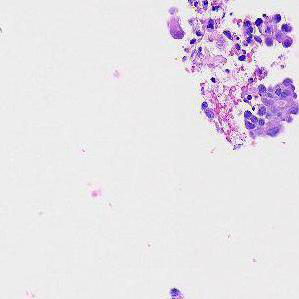

In [81]:
img